CS484 - HOMEWORK 2 - PART 2 SOURCE CODES: 
To run the above code properly, you should replace all the directory paths according to your local machine carefully.

In [ ]:
%pip install numpy opencv-python scikit-image matplotlib

In [2]:
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt
from skimage.segmentation import mark_boundaries
from scipy.io import savemat
import scipy.io as sio
from sklearn.cluster import KMeans
from skimage import io
from skimage.color import label2rgb
from skimage.util import img_as_ubyte  
from sklearn.preprocessing import StandardScaler
from scipy.spatial import distance_matrix

Part 1

Processing 1.jpg...
Label matrix saved at: /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/label_matrices/1_labels.npy
Segmented image saved at: /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/segmented_images/1_segmented.png
Processing 10.jpg...
Label matrix saved at: /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/label_matrices/10_labels.npy
Segmented image saved at: /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/segmented_images/10_segmented.png
Processing 2.jpg...
Label matrix saved at: /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/label_matrices/2_labels.npy
Segmented image saved at: /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/segmented_images/2_segmented.png
Processing 3.jpg...
Label matrix saved at: /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/label_matrices/3_labels.npy
Segmented image saved at: /Users/yasemi

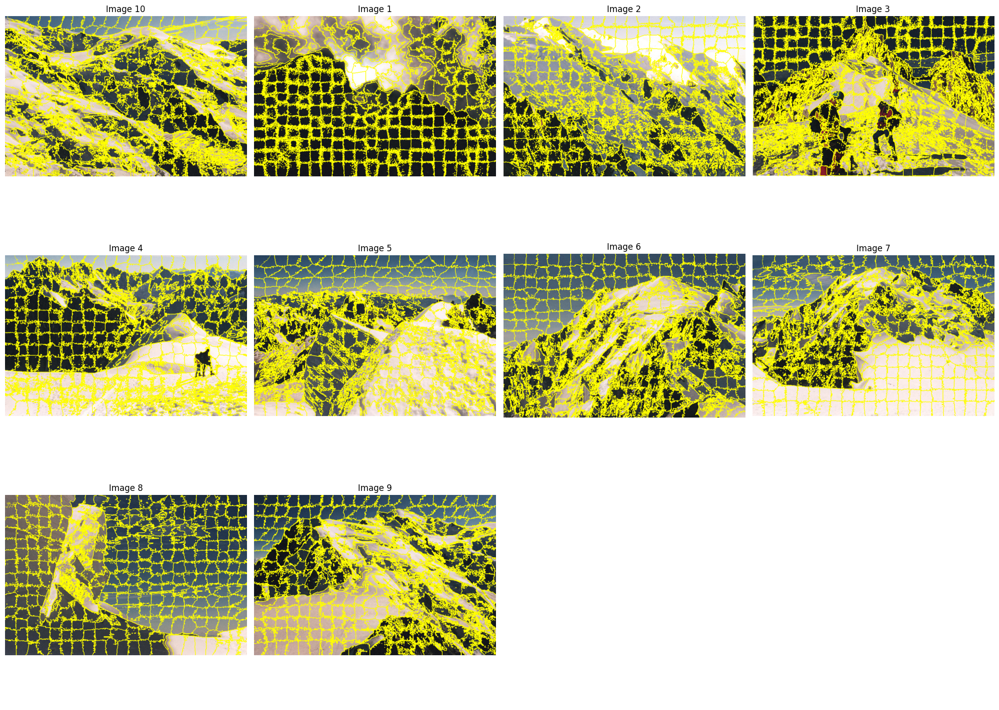

All images have been plotted.


In [ ]:
image_directory = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/part2' 
label_output_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/label_matrices' 
segmented_output_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/segmented_images'  

for directory in [label_output_dir, segmented_output_dir]:
    if not os.path.exists(directory):
        os.makedirs(directory)

k = 300  # # of superpixels
m = 15   # compactness 

def compute_gradient(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    gradient = np.sqrt(grad_x ** 2 + grad_y ** 2)
    return gradient

def initialize_cluster_centers(lab_image, image, S):
    h, w, _ = lab_image.shape
    gradient = compute_gradient(image)
    centers = []
    for y in range(S // 2, h, S):
        for x in range(S // 2, w, S):
            y0 = max(y - 1, 0)
            y1 = min(y + 2, h)
            x0 = max(x - 1, 0)
            x1 = min(x + 2, w)
            window = gradient[y0:y1, x0:x1]
            min_grad = np.min(window)
            idx = np.argwhere(window == min_grad)[0]
            yc = y0 + idx[0]
            xc = x0 + idx[1]
            color = lab_image[yc, xc]
            centers.append([color[0], color[1], color[2], yc, xc])
    return np.array(centers)

def enforce_connectivity(labels, n_centers):
    h, w = labels.shape
    new_labels = -1 * np.ones_like(labels)
    label = 0
    dx = [-1, 0, 1, 0]
    dy = [0, -1, 0, 1]
    elements = h * w // n_centers
    for i in range(h):
        for j in range(w):
            if new_labels[i, j] == -1:
                queue = [(i, j)]
                new_labels[i, j] = label
                count = 1
                while queue:
                    y, x = queue.pop(0)
                    for k_idx in range(4):
                        yn = y + dy[k_idx]
                        xn = x + dx[k_idx]
                        if 0 <= yn < h and 0 <= xn < w:
                            if new_labels[yn, xn] == -1 and labels[yn, xn] == labels[i, j]:
                                queue.append((yn, xn))
                                new_labels[yn, xn] = label
                                count += 1
                label += 1
    return new_labels

def slic(image, k, m=10, max_iter=10):
    h, w, ch = image.shape
    N = h * w  
    S = int(np.sqrt(N / k))  

    lab_image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB).astype(np.float64)

    centers = initialize_cluster_centers(lab_image, image, S)
    n_centers = centers.shape[0]

    labels = -1 * np.ones((h, w), dtype=np.int32)
    distances = np.full((h, w), np.inf)

    X, Y = np.meshgrid(np.arange(w), np.arange(h))

    for iteration in range(max_iter):
        for idx, center in enumerate(centers):
            l, a, b, yc, xc = center
            y0 = int(max(yc - S, 0))
            y1 = int(min(yc + S, h))
            x0 = int(max(xc - S, 0))
            x1 = int(min(xc + S, w))

            region = lab_image[y0:y1, x0:x1]
            l_region = region[:, :, 0]
            a_region = region[:, :, 1]
            b_region = region[:, :, 2]

            dc = np.sqrt((l_region - l) ** 2 + (a_region - a) ** 2 + (b_region - b) ** 2)

            x_region = X[y0:y1, x0:x1]
            y_region = Y[y0:y1, x0:x1]
            ds = np.sqrt((x_region - xc) ** 2 + (y_region - yc) ** 2)

            D = dc + (m / S) * ds

            mask = D < distances[y0:y1, x0:x1]
            distances[y0:y1, x0:x1][mask] = D[mask]
            labels[y0:y1, x0:x1][mask] = idx

        for idx in range(n_centers):
            mask = labels == idx
            if np.any(mask):
                l_mean = lab_image[:, :, 0][mask].mean()
                a_mean = lab_image[:, :, 1][mask].mean()
                b_mean = lab_image[:, :, 2][mask].mean()
                yc_mean = Y[mask].mean()
                xc_mean = X[mask].mean()
                centers[idx] = [l_mean, a_mean, b_mean, yc_mean, xc_mean]

    labels = enforce_connectivity(labels, n_centers)

    return labels

def save_label_matrix(labels, image_name, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    base_name = os.path.splitext(os.path.basename(image_name))[0]
    label_path = os.path.join(output_dir, f'{base_name}_labels.npy')
    np.save(label_path, labels)
    print(f"Label matrix saved at: {label_path}")

def save_segmented_image(image, labels, image_name, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    boundaries = mark_boundaries(image / 255.0, labels)
    plt.figure(figsize=(10, 10))
    plt.imshow(boundaries)
    plt.axis('off')
    base_name = os.path.splitext(os.path.basename(image_name))[0]
    output_path = os.path.join(output_dir, f'{base_name}_segmented.png')
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0)
    plt.close()
    print(f"Segmented image saved at: {output_path}")

def process_image(image_path, k, m, save_labels=False, save_visualization=False, plot_results=False):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error reading image {image_path}. Skipping.")
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    labels = slic(image, k, m)

    if save_labels:
        save_label_matrix(labels, image_path, output_dir=label_output_dir)

    if save_visualization:
        save_segmented_image(image, labels, image_path, output_dir=segmented_output_dir)

    if plot_results:
        plot_segmented_image(image, labels)

    return labels

def plot_segmented_image(image, labels):
    boundaries = mark_boundaries(image / 255.0, labels)
    plt.figure(figsize=(8, 8))
    plt.imshow(boundaries)
    plt.title('Segmented Image with Superpixel Boundaries')
    plt.axis('off')
    plt.show()

def plot_segmented_images_grid(segmented_dir, grid_size=(3, 4)):
    
    segmented_files = [f for f in os.listdir(segmented_dir) if f.endswith('_segmented.png')]
    segmented_files.sort() 

    num_images = len(segmented_files)
    rows, cols = grid_size
    fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
    axes = axes.flatten()

    for i in range(rows * cols):
        if i < num_images:
            image_path = os.path.join(segmented_dir, segmented_files[i])
            image = plt.imread(image_path)
            ax = axes[i]
            ax.imshow(image)
            base_name = segmented_files[i].replace('_segmented.png', '')
            ax.set_title(f"Image {base_name}", fontsize=12)
            ax.axis('off')
        else:
            axes[i].axis('off') 

    plt.tight_layout()
    plt.show()

save_labels = True
save_visualization = True
plot_results = False  

image_files = [f for f in os.listdir(image_directory) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
image_files.sort() 

for image_file in image_files:
    image_path = os.path.join(image_directory, image_file)
    print(f"Processing {image_file}...")
    labels = process_image(
        image_path,
        k=k,
        m=m,
        save_labels=save_labels,
        save_visualization=save_visualization,
        plot_results=plot_results
    )

print("\nPlotting all segmented images in a 3x4 grid...")
plot_segmented_images_grid(segmented_dir=segmented_output_dir, grid_size=(3, 4))
print("All images have been plotted.")

Part 2 (Other source code is in the "CS484_HW2_Part_2.m" file.)

In [90]:
label_dir = 'label_matrices'  
output_dir = 'label_matrices_mat'  

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for filename in os.listdir(label_dir):
    if filename.endswith('_labels.npy'):
        label_path = os.path.join(label_dir, filename)
        labels = np.load(label_path)
        base_name = os.path.splitext(filename)[0]
        output_path = os.path.join(output_dir, base_name + '.mat')
        savemat(output_path, {'labels': labels})
        print(f'Saved {output_path}')

Saved label_matrices_mat/7_labels.mat
Saved label_matrices_mat/2_labels.mat
Saved label_matrices_mat/8_labels.mat
Saved label_matrices_mat/5_labels.mat
Saved label_matrices_mat/10_labels.mat
Saved label_matrices_mat/3_labels.mat
Saved label_matrices_mat/6_labels.mat
Saved label_matrices_mat/1_labels.mat
Saved label_matrices_mat/9_labels.mat
Saved label_matrices_mat/4_labels.mat


Part 3

Total superpixels: 124210
Clustering completed with 8 clusters.
Saved cluster label matrix to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_label_matrices/10_cluster_labels.npy
Saved clustered image to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/pseudo/10_clustered.png
Saved cluster label matrix to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_label_matrices/1_cluster_labels.npy
Saved clustered image to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/pseudo/1_clustered.png
Saved cluster label matrix to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_label_matrices/2_cluster_labels.npy
Saved clustered image to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/pseudo/2_clustered.png
Saved cluster label matrix to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_label_matrices/3_cluster_labels.n

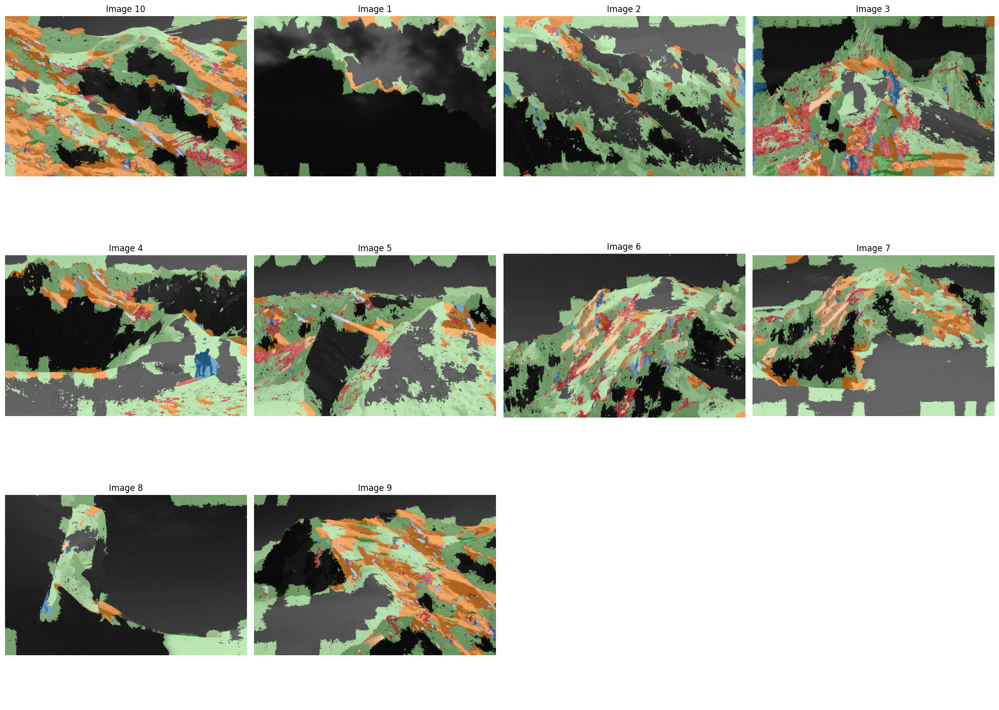

In [4]:
feature_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/feature_matrices'  
label_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/label_matrices'   
image_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/part2'             
output_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/pseudo'             
cluster_label_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_label_matrices'  

for directory in [output_dir, cluster_label_dir]:
    if not os.path.exists(directory):
        os.makedirs(directory)

k = 8 

feature_files = [f for f in os.listdir(feature_dir) if f.endswith('_features.mat')]
feature_files.sort()  

all_features = []
superpixel_info = []  
total_superpixels = 0

for i, feature_file_name in enumerate(feature_files):
    feature_file = os.path.join(feature_dir, feature_file_name)
    data = sio.loadmat(feature_file)
    feature_matrix = data['feature_matrix']  
    
    all_features.append(feature_matrix)

    base_name = feature_file_name.replace('_features.mat', '')
    label_file = os.path.join(label_dir, f"{base_name}_labels.npy")
    if os.path.exists(label_file):
        labels = np.load(label_file)
    else:
        print(f'Label file {label_file} not found. Skipping.')
        continue

    num_superpixels = feature_matrix.shape[0]
    superpixel_info.extend([{'image_index': i, 'image_name': base_name, 'labels': labels}] * num_superpixels)

    total_superpixels += num_superpixels

print(f'Total superpixels: {total_superpixels}')

all_features_array = np.vstack(all_features)

kmeans = KMeans(n_clusters=k, max_iter=1000, n_init=10, random_state=42)
cluster_labels = kmeans.fit_predict(all_features_array)

print(f'Clustering completed with {k} clusters.')

num_images = len(feature_files)
image_cluster_labels = [[] for _ in range(num_images)]

start_idx = 0
for i, feature_matrix in enumerate(all_features):
    num_superpixels = feature_matrix.shape[0]
    end_idx = start_idx + num_superpixels
    image_cluster_labels[i] = cluster_labels[start_idx:end_idx]
    start_idx = end_idx

pseudo_color_images = []

for i, feature_file_name in enumerate(feature_files):
    base_name = feature_file_name.replace('_features.mat', '')
    image_name = f"{base_name}.jpg" 
    image_path = os.path.join(image_dir, image_name)
    if os.path.exists(image_path):
        img = io.imread(image_path)
    else:
        print(f'Image file {image_path} not found. Skipping.')
        continue

    label_file = os.path.join(label_dir, f"{base_name}_labels.npy")
    labels = np.load(label_file)

    labels = labels.astype(int)

    clusters = image_cluster_labels[i]

    cluster_label_image = np.zeros_like(labels, dtype=int)
    num_superpixels = len(clusters)
    for k_idx in range(num_superpixels):
        cluster_label = clusters[k_idx]
        cluster_label_image[labels == k_idx] = cluster_label

    cluster_label_file = os.path.join(cluster_label_dir, f"{base_name}_cluster_labels.npy")
    np.save(cluster_label_file, cluster_label_image)
    print(f'Saved cluster label matrix to {cluster_label_file}')

    cluster_rgb_image_alpha = label2rgb(
        cluster_label_image,
        image=img,
        colors=[plt.get_cmap('tab20')(j)[:3] for j in range(k)],
        kind='overlay',
        alpha=0.6  
    )
    
    cluster_rgb_image = cluster_rgb_image_alpha

    cluster_rgb_image = img_as_ubyte(cluster_rgb_image)

    output_file = os.path.join(output_dir, f"{base_name}_clustered.png")
    io.imsave(output_file, cluster_rgb_image)
    print(f'Saved clustered image to {output_file}')

    pseudo_color_images.append(cluster_rgb_image)

num_images_to_plot = len(pseudo_color_images)
num_rows = 3
num_cols = 4

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))
axes = axes.flatten()

for idx in range(num_rows * num_cols):
    if idx < num_images_to_plot:
        axes[idx].imshow(pseudo_color_images[idx])
        axes[idx].axis('off')
        base_name = feature_files[idx].replace('_features.mat', '')
        axes[idx].set_title(f"Image {base_name}", fontsize=12)
    else:
        axes[idx].axis('off')

plt.tight_layout()
combined_figure_file = os.path.join(output_dir, 'combined_pseudo_color_images.png')
plt.savefig(combined_figure_file, bbox_inches='tight', pad_inches=0)
print(f'Saved combined pseudo-color images to {combined_figure_file}')
plt.show()

Part 4

Total superpixels: 124210
Initial clustering completed with 8 clusters.
Contextual feature vectors shape: (124210, 48)
Contextual clustering completed with 8 clusters.
Saved contextual cluster label matrix to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_label_matrices/10_cluster_labels_contextual.npy
Saved boundary-overlay image to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_boundaries/10_boundaries.png
Saved clustered overlay image to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/pseudo/10_clustered_overlay.png
Saved contextual cluster label matrix to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_label_matrices/1_cluster_labels_contextual.npy
Saved boundary-overlay image to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_boundaries/1_boundaries.png
Saved clustered overlay image to /Users/yaseminakin/Desktop/CS484 - Introduction t

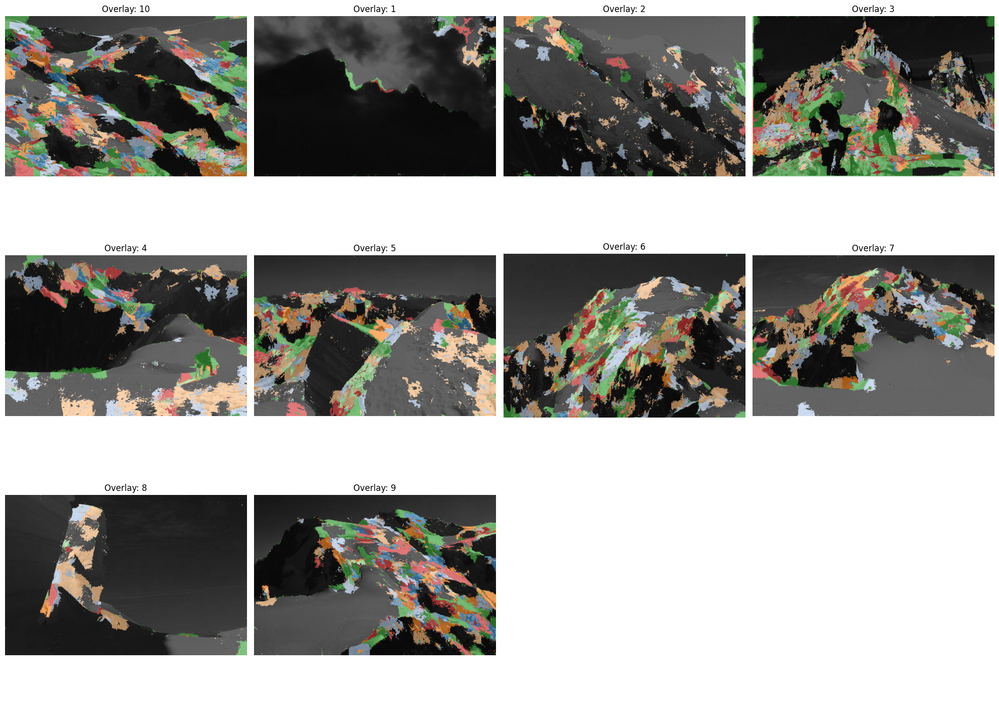

Saved combined boundary-marked images to /Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/pseudo/combined_boundary_marked_images.png


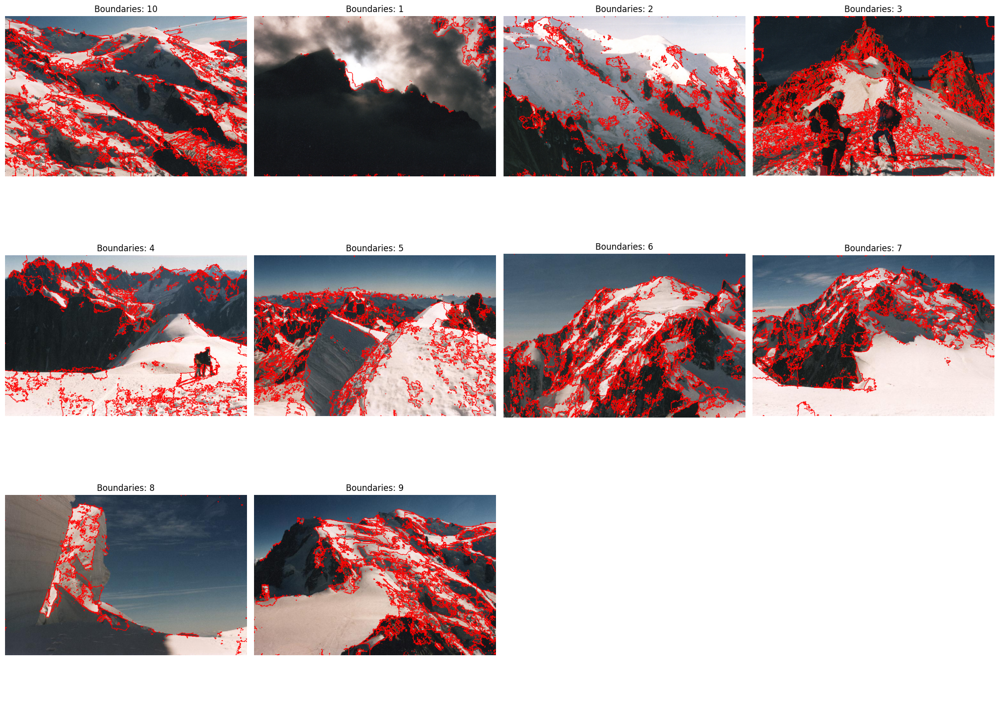

In [ ]:
feature_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/feature_matrices'  
label_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/label_matrices'   
image_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/part2'             
output_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/pseudo'             
cluster_label_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_label_matrices' 
boundary_output_dir = '/Users/yaseminakin/Desktop/CS484 - Introduction to Computer Vision/HW2/cluster_boundaries'  

for directory in [output_dir, cluster_label_dir, boundary_output_dir]:
    if not os.path.exists(directory):
        os.makedirs(directory)

k_initial = 8  
k_final = 8    
ring_threshold = 15 

first_ring_multiplier = 3
second_ring_multiplier = 4

def compute_centroids_diameters(labels):
    superpixel_ids = np.unique(labels)
    centroids = {}
    diameters = {}
    for sp in superpixel_ids:
        mask = labels == sp
        coords = np.column_stack(np.nonzero(mask))  
        centroid = coords.mean(axis=0) 
        area = mask.sum()
        diameter = np.sqrt(4 * area / np.pi)  
        centroids[sp] = centroid
        diameters[sp] = diameter
    return centroids, diameters

def find_neighbors(centroids, diameters, superpixel_id, first_ring_radius, second_ring_radius):
    target_centroid = centroids[superpixel_id]
    all_centroids = np.array([centroids[sp] for sp in centroids])
    superpixel_ids = list(centroids.keys())
    
    distances = np.linalg.norm(all_centroids - target_centroid, axis=1)
    
    first_ring_min = 0  
    first_ring_max = first_ring_radius
    first_level_indices = np.where((distances > first_ring_min) & (distances <= first_ring_max))[0]
    first_level_neighbors = [superpixel_ids[idx] for idx in first_level_indices]
    
    second_ring_min = first_ring_radius
    second_ring_max = second_ring_radius
    second_level_indices = np.where((distances > second_ring_min) & (distances <= second_ring_max))[0]
    second_level_neighbors = [superpixel_ids[idx] for idx in second_level_indices]
    
    return first_level_neighbors, second_level_neighbors

def compute_average_features(feature_matrix, neighbors):
    if not neighbors:
        return np.zeros(feature_matrix.shape[1])
    return feature_matrix[neighbors].mean(axis=0)

def overlay_boundaries(image_path, cluster_label_path, output_path, boundary_color=(1, 0, 0)):
    image = io.imread(image_path)
    if image.ndim == 2:  
        image = np.stack((image,)*3, axis=-1)
    
    cluster_labels = np.load(cluster_label_path)
    
    boundary_image = mark_boundaries(image, cluster_labels, color=boundary_color, mode='thick')
    
    boundary_image_uint8 = img_as_ubyte(boundary_image)
    
    io.imsave(output_path, boundary_image_uint8)
    
    return boundary_image_uint8

def main():
    feature_files = [f for f in os.listdir(feature_dir) if f.endswith('_features.mat')]
    feature_files.sort()  
    
    all_contextual_features = []
    image_superpixels = []  
    image_labels_list = []  
    
    all_features = []
    superpixel_info = []  
    total_superpixels = 0
    
    for i, feature_file_name in enumerate(feature_files):
        feature_file = os.path.join(feature_dir, feature_file_name)
        data = sio.loadmat(feature_file)
        feature_matrix = data['feature_matrix']  
        if feature_matrix.ndim != 2:
            print(f'Feature matrix in {feature_file_name} is not 2D. Skipping.')
            continue
        
        all_features.append(feature_matrix)
    
        base_name = feature_file_name.replace('_features.mat', '')
        label_file = os.path.join(label_dir, f"{base_name}_labels.npy")
        if os.path.exists(label_file):
            labels = np.load(label_file)
        else:
            print(f'Label file {label_file} not found. Skipping.')
            continue
    
        num_superpixels = feature_matrix.shape[0]
        image_superpixels.append(np.unique(labels))
        image_labels_list.append(labels)
        superpixel_info.extend([{'image_index': i, 'image_name': base_name, 'labels': labels}] * num_superpixels)
    
        total_superpixels += num_superpixels
    
    print(f'Total superpixels: {total_superpixels}')
    
    if not all_features:
        print("No feature matrices loaded. Exiting.")
        return
    
    all_features_array = np.vstack(all_features)
    
    scaler = StandardScaler()
    all_features_normalized = scaler.fit_transform(all_features_array)
    
    kmeans_initial = KMeans(n_clusters=k_initial, max_iter=1000, n_init=10, random_state=42)
    initial_cluster_labels = kmeans_initial.fit_predict(all_features_normalized)
    
    print(f'Initial clustering completed with {k_initial} clusters.')
    
    all_contextual_features = []
    feature_start_idx = 0
    for i, feature_file_name in enumerate(feature_files):
        base_name = feature_file_name.replace('_features.mat', '')
        labels = image_labels_list[i]
        superpixel_ids = np.unique(labels)
        feature_matrix = all_features[i]
        num_superpixels = len(superpixel_ids)
        
        cluster_labels = initial_cluster_labels[feature_start_idx : feature_start_idx + num_superpixels]
        feature_start_idx += num_superpixels
    
        centroids, diameters = compute_centroids_diameters(labels)
    
        average_diameter = np.mean(list(diameters.values()))
    
        first_ring_radius = first_ring_multiplier * average_diameter
        second_ring_radius = second_ring_multiplier * average_diameter
    
        superpixel_list = list(centroids.keys())
        centroid_array = np.array([centroids[sp] for sp in superpixel_list])
        dist_matrix = distance_matrix(centroid_array, centroid_array)
    
        for idx, sp in enumerate(superpixel_list):
            first_level_neighbors, second_level_neighbors = find_neighbors(
                centroids, diameters, sp, first_ring_radius, second_ring_radius
            )
    
            first_level_neighbors = [
                neighbor_sp for neighbor_sp in first_level_neighbors
                if (labels == neighbor_sp).sum() >= ring_threshold
            ]
            second_level_neighbors = [
                neighbor_sp for neighbor_sp in second_level_neighbors
                if (labels == neighbor_sp).sum() >= ring_threshold
            ]
    
            sp_feature = feature_matrix[idx, :]  
            sp_feature = sp_feature.flatten()
    
            first_neighbor_indices = [superpixel_list.index(neighbor_sp) for neighbor_sp in first_level_neighbors if neighbor_sp in superpixel_list]
            if first_neighbor_indices:
                first_neighbor_features = feature_matrix[first_neighbor_indices, :]
                first_neighbor_avg = first_neighbor_features.mean(axis=0)
            else:
                first_neighbor_avg = np.zeros(feature_matrix.shape[1])
            first_neighbor_avg = first_neighbor_avg.flatten()
    
            second_neighbor_indices = [superpixel_list.index(neighbor_sp) for neighbor_sp in second_level_neighbors if neighbor_sp in superpixel_list]
            if second_neighbor_indices:
                second_neighbor_features = feature_matrix[second_neighbor_indices, :]
                second_neighbor_avg = second_neighbor_features.mean(axis=0)
            else:
                second_neighbor_avg = np.zeros(feature_matrix.shape[1])
            second_neighbor_avg = second_neighbor_avg.flatten()
    
            contextual_feature = np.concatenate((sp_feature, first_neighbor_avg, second_neighbor_avg))
            all_contextual_features.append(contextual_feature)
    
    all_contextual_features_array = np.array(all_contextual_features)
    
    print(f'Contextual feature vectors shape: {all_contextual_features_array.shape}')
    
    scaler_context = StandardScaler()
    all_contextual_features_normalized = scaler_context.fit_transform(all_contextual_features_array)
    
    kmeans_final = KMeans(n_clusters=k_final, max_iter=1000, n_init=10, random_state=42)
    final_cluster_labels = kmeans_final.fit_predict(all_contextual_features_normalized)
    
    print(f'Contextual clustering completed with {k_final} clusters.')
    
    cluster_feature_start_idx = 0
    pseudo_color_images = []  
    boundary_images = []    
    
    for i, feature_file_name in enumerate(feature_files):
        base_name = feature_file_name.replace('_features.mat', '')
        image_file = f"{base_name}.jpg"  
        image_path = os.path.join(image_dir, image_file)
        cluster_label_file = f"{base_name}_cluster_labels_contextual.npy"
        cluster_label_path = os.path.join(cluster_label_dir, cluster_label_file)
        
        if not os.path.exists(image_path):
            print(f'Image file {image_path} not found. Skipping.')
            continue
        
        if not os.path.exists(cluster_label_path):
            print(f'Cluster label file {cluster_label_path} not found. Skipping.')
            continue
        
        labels = image_labels_list[i]
        superpixel_ids = np.unique(labels)
        num_superpixels = len(superpixel_ids)
        
        final_labels = final_cluster_labels[cluster_feature_start_idx : cluster_feature_start_idx + num_superpixels]
        cluster_feature_start_idx += num_superpixels
        
        cluster_label_image = np.zeros_like(labels, dtype=int)
        for sp_id, cluster in zip(superpixel_ids, final_labels):
            cluster_label_image[labels == sp_id] = cluster
        
        np.save(cluster_label_path, cluster_label_image)
        print(f'Saved contextual cluster label matrix to {cluster_label_path}')
        
        boundary_output_file = f"{base_name}_boundaries.png"
        boundary_output_path = os.path.join(boundary_output_dir, boundary_output_file)
        boundary_image = overlay_boundaries(image_path, cluster_label_path, boundary_output_path)
        print(f'Saved boundary-overlay image to {boundary_output_path}')
        
      
        cluster_rgb_image_alpha = label2rgb(
            cluster_label_image,
            image=io.imread(image_path),
            colors=[plt.get_cmap('tab20')(j)[:3] for j in range(k_final)],
            kind='overlay',
            alpha=0.6 
        )
    
        cluster_rgb_image = cluster_rgb_image_alpha
    
        cluster_rgb_image = img_as_ubyte(cluster_rgb_image)
    
        output_file = os.path.join(output_dir, f"{base_name}_clustered_overlay.png")
        io.imsave(output_file, cluster_rgb_image)
        print(f'Saved clustered overlay image to {output_file}')
    
        boundary_images.append(boundary_image)
    
        pseudo_color_images.append(cluster_rgb_image)
    
    num_images_to_plot = len(pseudo_color_images)
    num_rows = 3
    num_cols = 4
    
    fig1, axes1 = plt.subplots(num_rows, num_cols, figsize=(20, 15))
    axes1 = axes1.flatten()
    
    for idx in range(num_rows * num_cols):
        if idx < num_images_to_plot:
            axes1[idx].imshow(pseudo_color_images[idx])
            axes1[idx].axis('off')
            base_name = feature_files[idx].replace('_features.mat', '')
            axes1[idx].set_title(f"Overlay: {base_name}", fontsize=12)
        else:
            axes1[idx].axis('off')
    
    plt.tight_layout()
    combined_overlay_file = os.path.join(output_dir, 'combined_pseudo_color_overlays.png')
    plt.savefig(combined_overlay_file, bbox_inches='tight', pad_inches=0)
    print(f'Saved combined pseudo-color overlays to {combined_overlay_file}')
    plt.show()
    
    num_boundary_images = len(boundary_images)
    fig2, axes2 = plt.subplots(num_rows, num_cols, figsize=(20, 15))
    axes2 = axes2.flatten()
    
    for idx in range(num_rows * num_cols):
        if idx < num_boundary_images:
            axes2[idx].imshow(boundary_images[idx])
            axes2[idx].axis('off')
            base_name = feature_files[idx].replace('_features.mat', '')
            axes2[idx].set_title(f"Boundaries: {base_name}", fontsize=12)
        else:
            axes2[idx].axis('off')
    
    plt.tight_layout()
    combined_boundary_file = os.path.join(output_dir, 'combined_boundary_marked_images.png')
    plt.savefig(combined_boundary_file, bbox_inches='tight', pad_inches=0)
    print(f'Saved combined boundary-marked images to {combined_boundary_file}')
    plt.show()

if __name__ == "__main__":
    main()